Testing VAE to verify it can faithfully reconstruct masks.

In [2]:
from diffusers import AutoencoderKL

/home/pedro/miniconda/envs/marigold/lib/python3.10/site-packages/xformers/ops/fmha/flash.py:211: FutureWarning: `torch.library.impl_abstract` was renamed to `torch.library.register_fake`. Please use that instead; we will remove `torch.library.impl_abstract` in a future version of PyTorch.
  @torch.library.impl_abstract("xformers_flash::flash_fwd")
/home/pedro/miniconda/envs/marigold/lib/python3.10/site-packages/xformers/ops/fmha/flash.py:344: FutureWarning: `torch.library.impl_abstract` was renamed to `torch.library.register_fake`. Please use that instead; we will remove `torch.library.impl_abstract` in a future version of PyTorch.
  @torch.library.impl_abstract("xformers_flash::flash_bwd")


^ **TODO** reinstall the environment, I don't want xformers

In [67]:
from PIL import Image

In [3]:
import torch
torch.__version__

'2.4.0+cu121'

In [5]:
vae = AutoencoderKL.from_pretrained("/home/pedro/code/hf/diffusers/marigold-segmentation/checkpoints/stable-diffusion-2", subfolder="vae")

In [58]:
vae = vae.to("cuda:0").eval()

In [11]:
from diffusers.image_processor import VaeImageProcessor

In [13]:
image_processor = VaeImageProcessor(vae_scale_factor=8)

In [15]:
from cocogold.dataset import CocoGoldIterableDataset

In [16]:
base_data_dir = "/data/datasets/coco/2017"

When returning `"pil"`, we get images for original (cropped) + mask. When returning `"pt"`, images are normalized to `[-1, 1]`, and masks consist of exactly `-1` (background) and `1` (foreground) values.

In [31]:
val_dataset = CocoGoldIterableDataset(
    base_data_dir,
    split="val",
    return_type="pil",
)

val_dataset_pt = CocoGoldIterableDataset(
    base_data_dir,
    split="val",
    return_type="pt",
)

loading annotations into memory...
Done (t=0.75s)
creating index...
index created!
Filtering images with no annotations
Filtering images whose height or width < 300
loading annotations into memory...
Done (t=0.31s)
creating index...
index created!
Filtering images with no annotations
Filtering images whose height or width < 300


In [32]:
item = next(iter(val_dataset))

Let's try to encode and decode the image first.

In [88]:
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

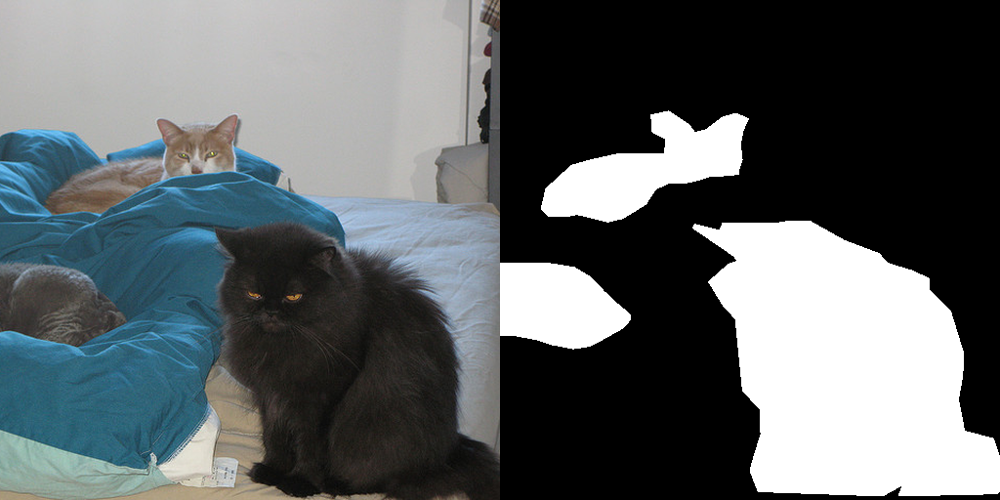

In [90]:
image_grid([item["image"], item["mask"]], 1, 2)

In [91]:
item["class"]

'cat'

In [92]:
image = item["image"]
image = image_processor.preprocess(image)

In [93]:
image.min(), image.max()

(tensor(-1.), tensor(1.))

In [94]:
item_pt = next(iter(val_dataset_pt))

In [95]:
(item_pt["image"] - image).sum()

tensor(0.)

Ok, so the image processor only converts to the expected range.

**TODO** I'm not sure training is running in float32, float16 or what.

In [96]:
vae.device, vae.dtype

(device(type='cuda', index=0), torch.float32)

In [97]:
with torch.inference_mode():
    latents = vae.encode(image.to(vae.device)).latent_dist.sample()

In [98]:
latents.shape

torch.Size([1, 4, 64, 64])

Do we need to scale the latents or not?

In [111]:
@torch.inference_mode()
def decode_latents(latents):
    decoded = vae.decode(latents, return_dict=False)[0]
    return image_processor.postprocess(decoded)[0]

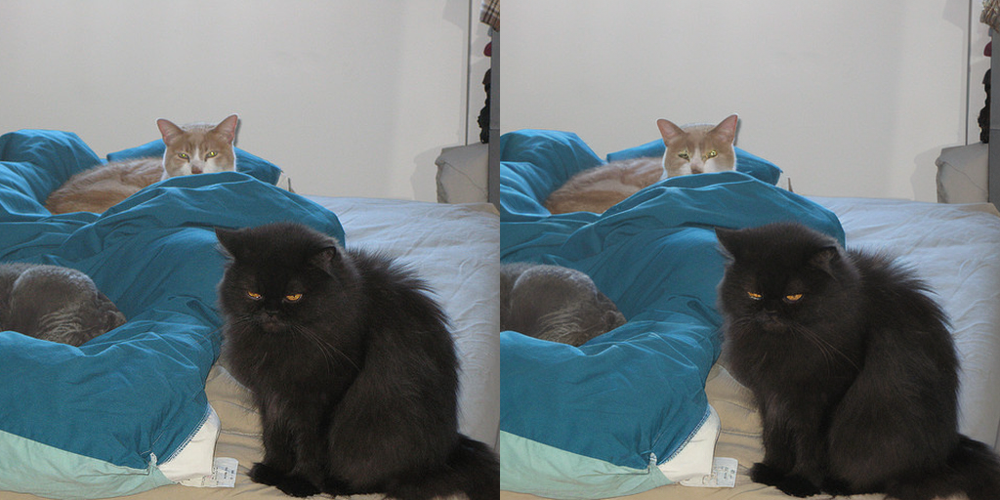

In [112]:
image_grid([item["image"], decode_latents(latents)], 1, 2)

In [118]:
@torch.inference_mode()
def show_original_vs_decoded(image):
    # [-1, 1], tensor
    preprocessed = image_processor.preprocess(image)
    latents = vae.encode(preprocessed.to(vae.device)).latent_dist.sample()
    decoded = decode_latents(latents)
    display(image_grid([image, decoded], 1, 2))

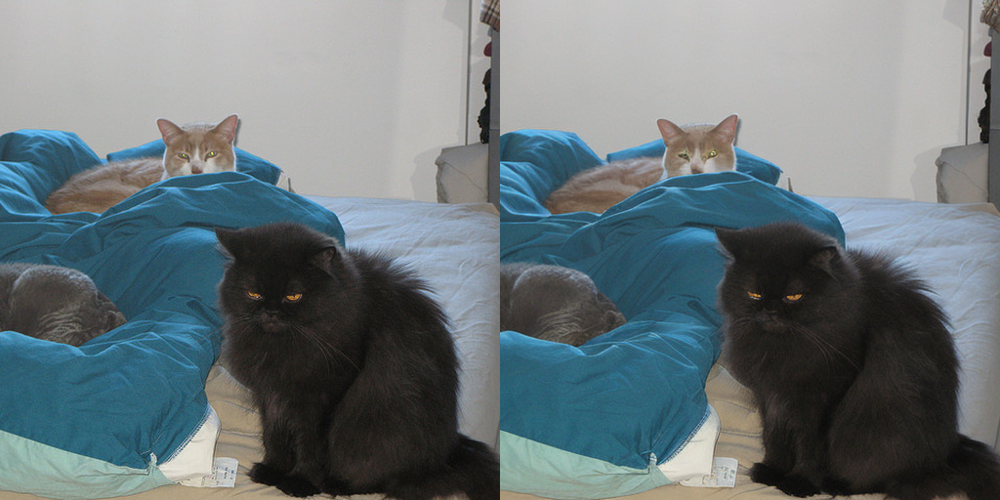

In [119]:
show_original_vs_decoded(item["image"])

How good are mask reconstructions?

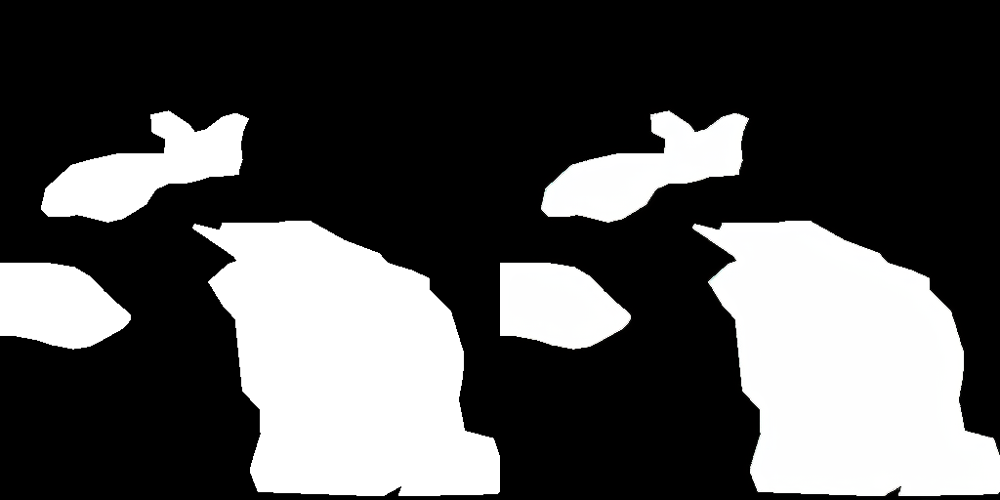

In [120]:
show_original_vs_decoded(item["mask"])

They look quite good to me.

cat


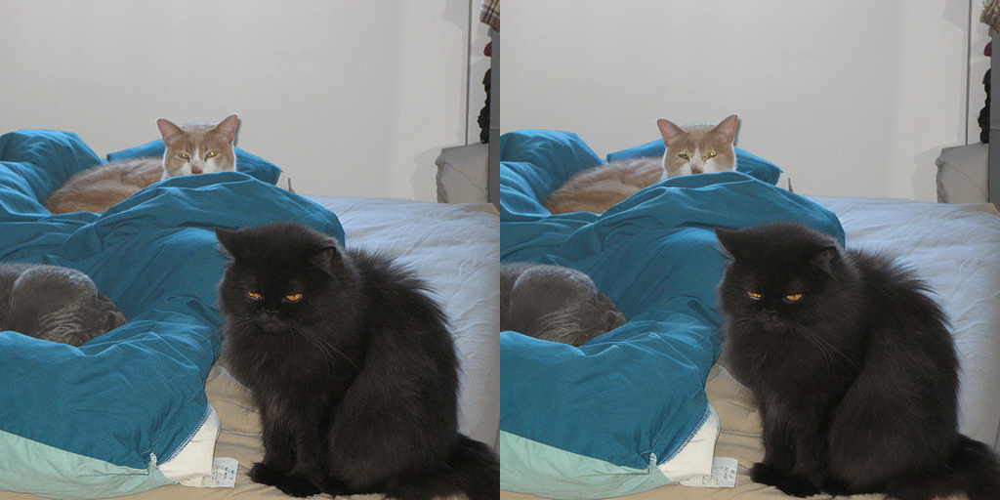

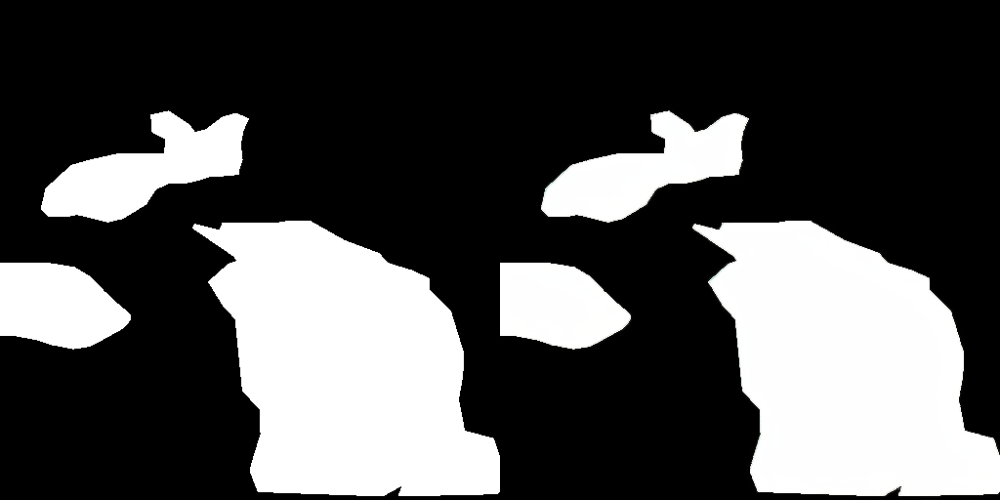

toilet


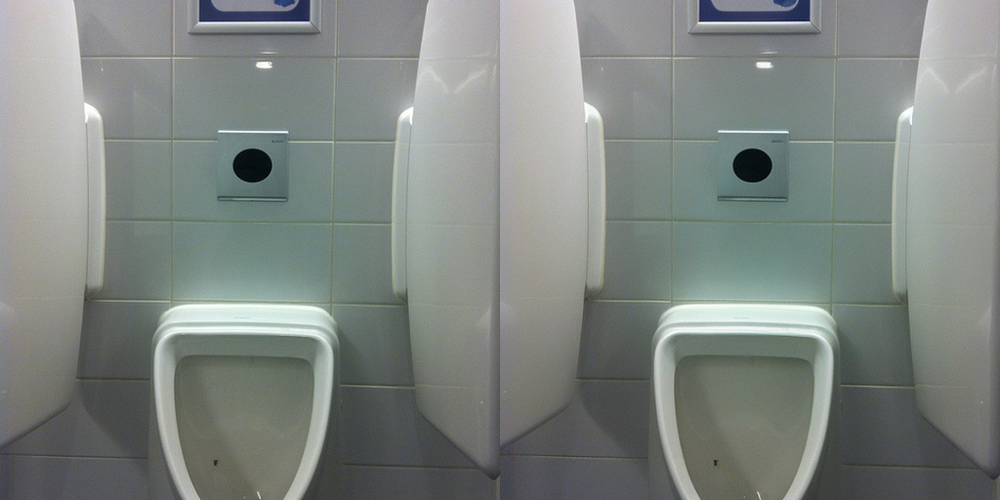

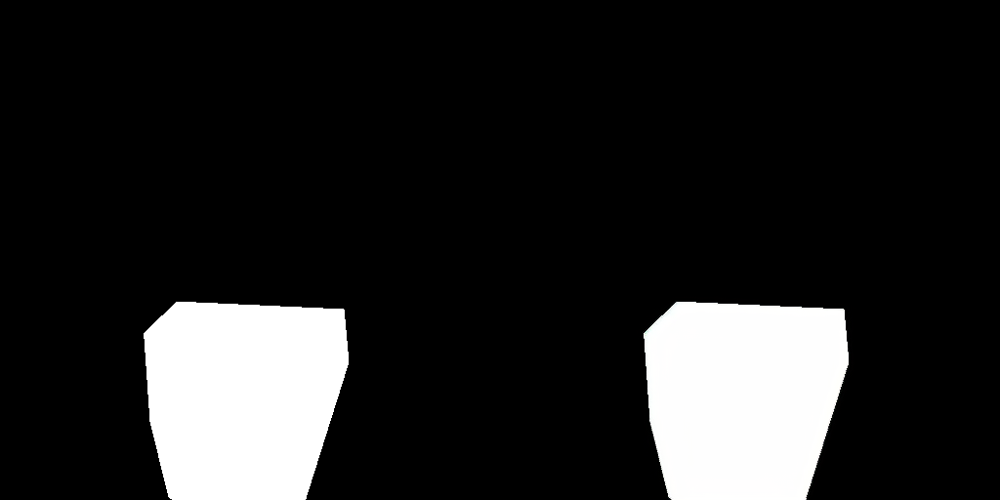

person


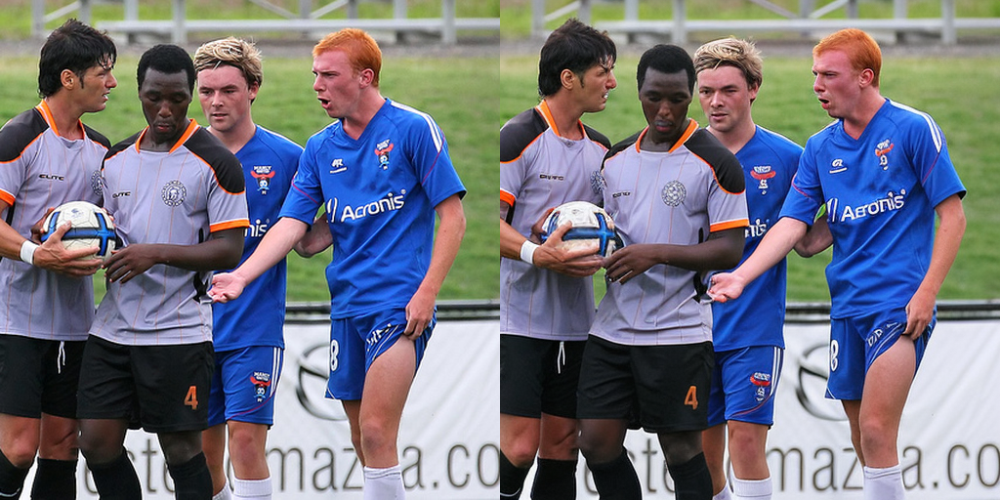

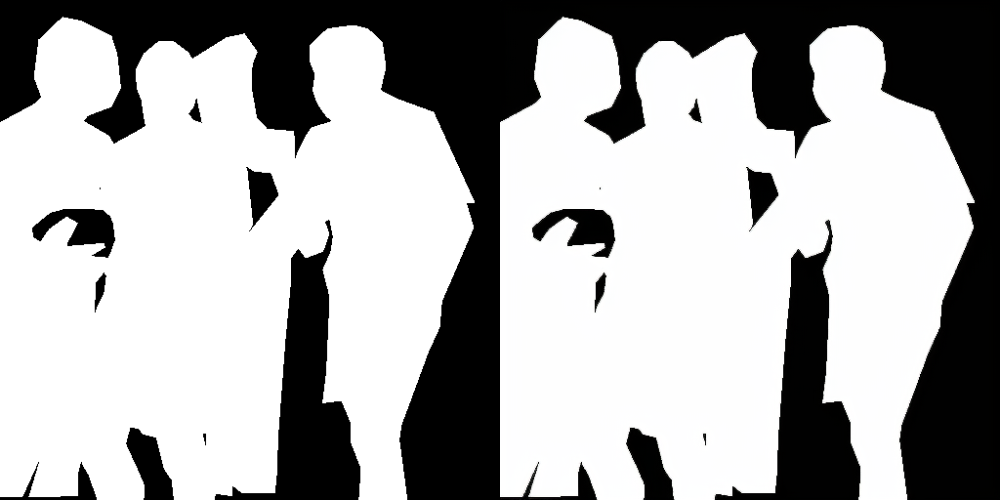

clock


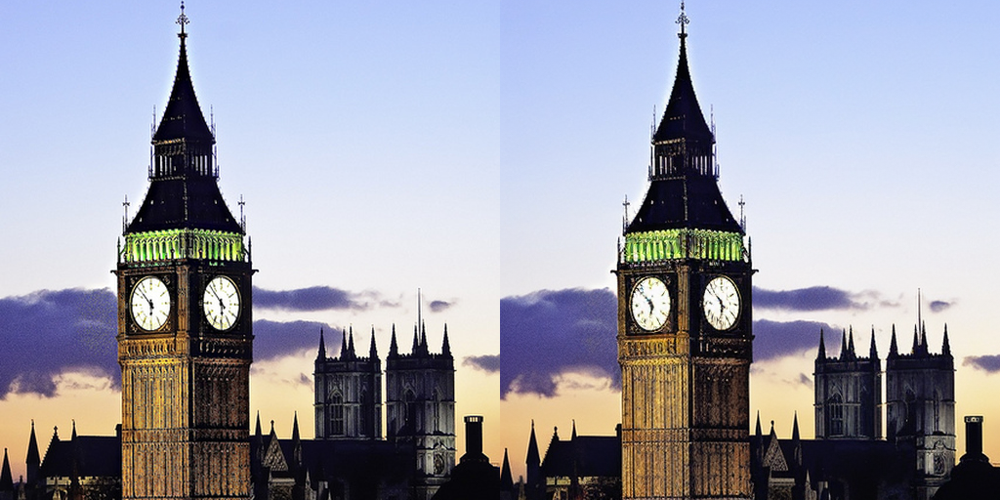

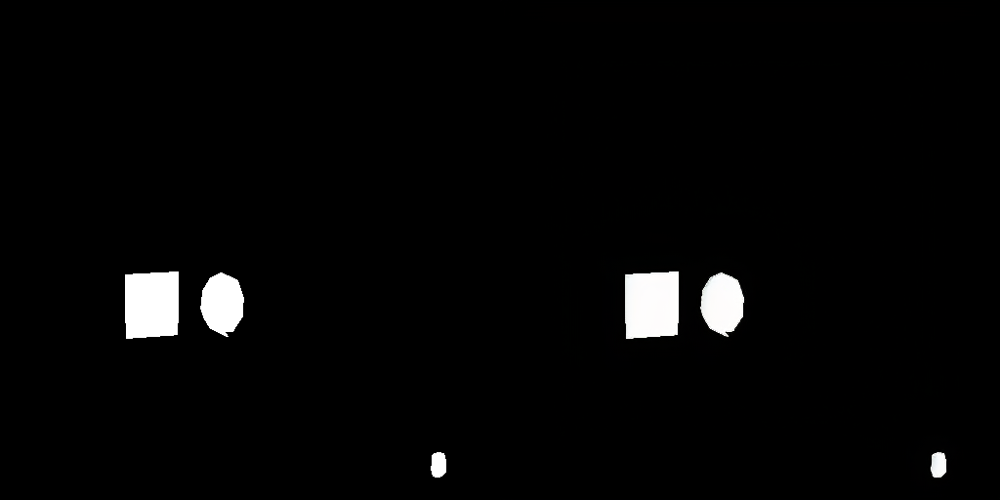

knife


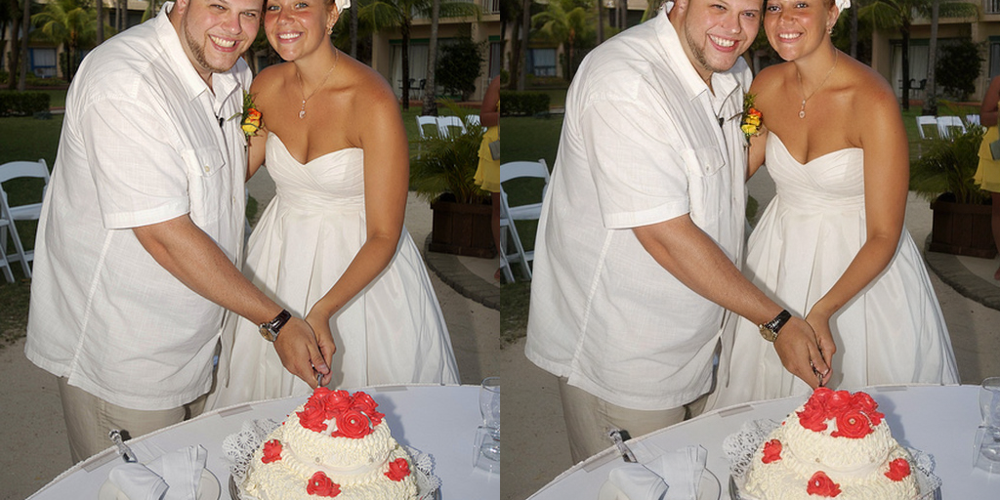

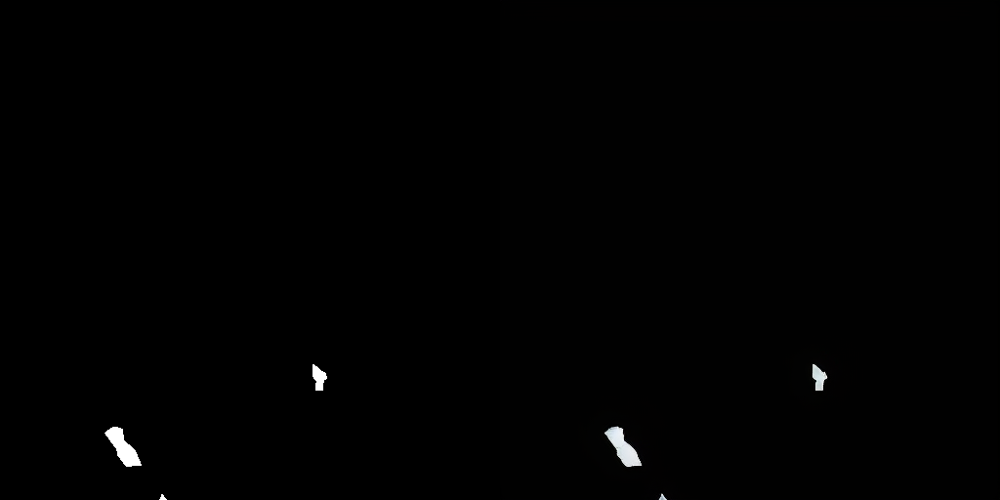

dog


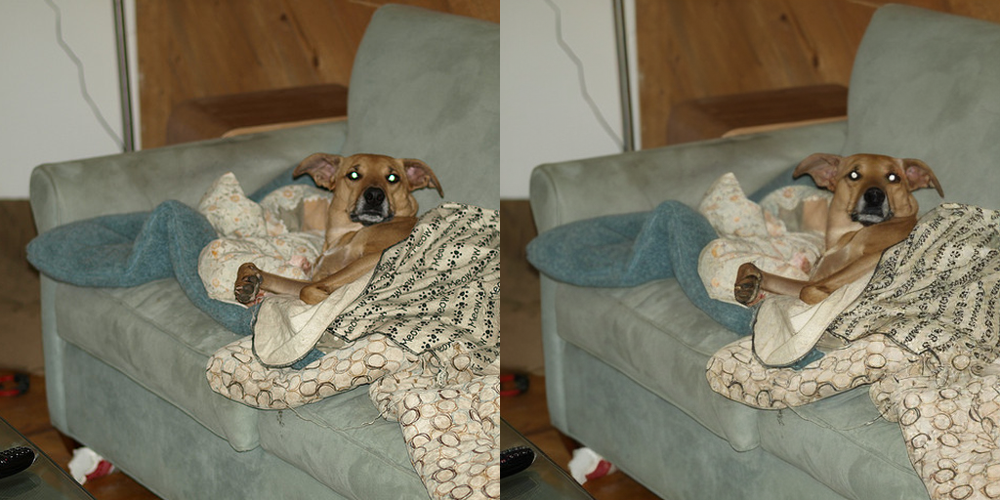

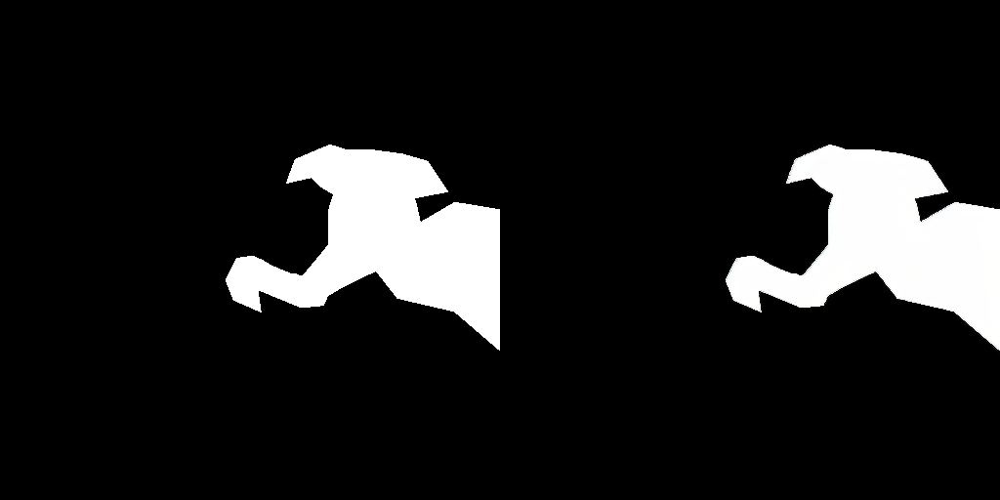

frisbee


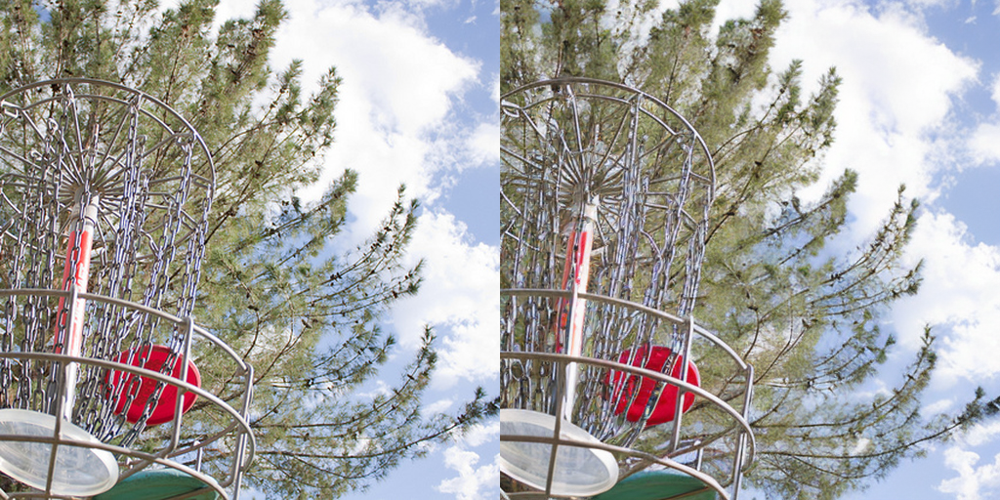

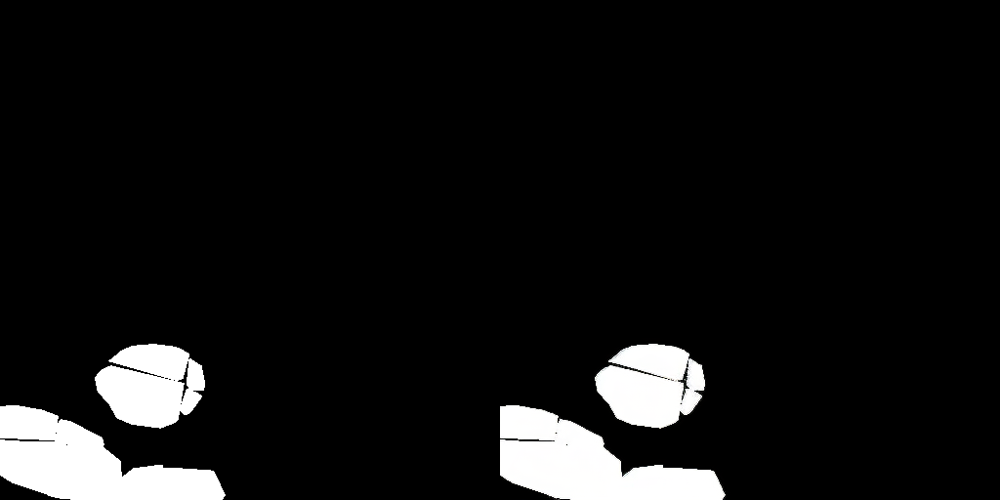

person


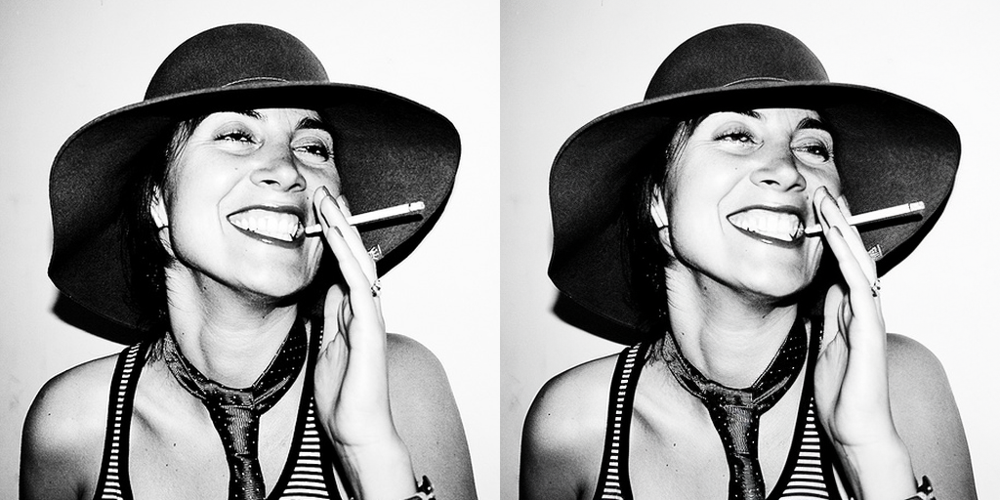

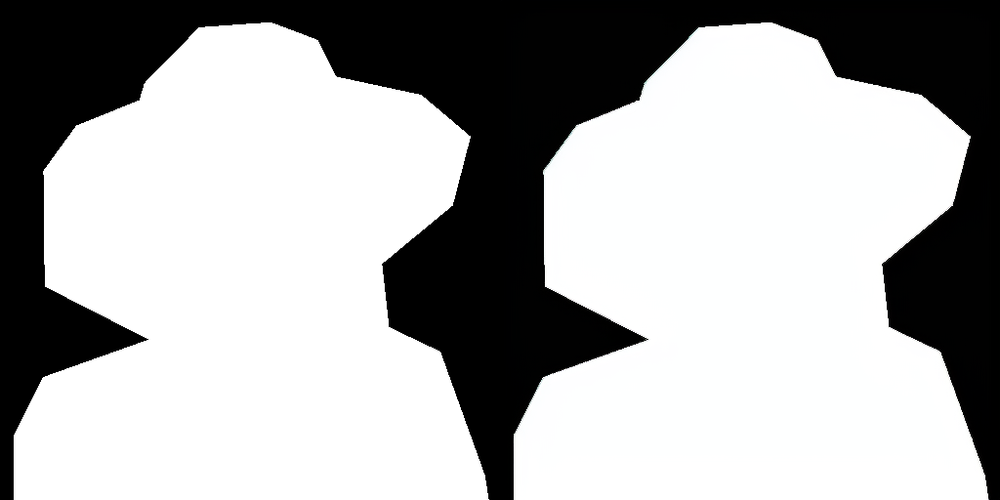

bus


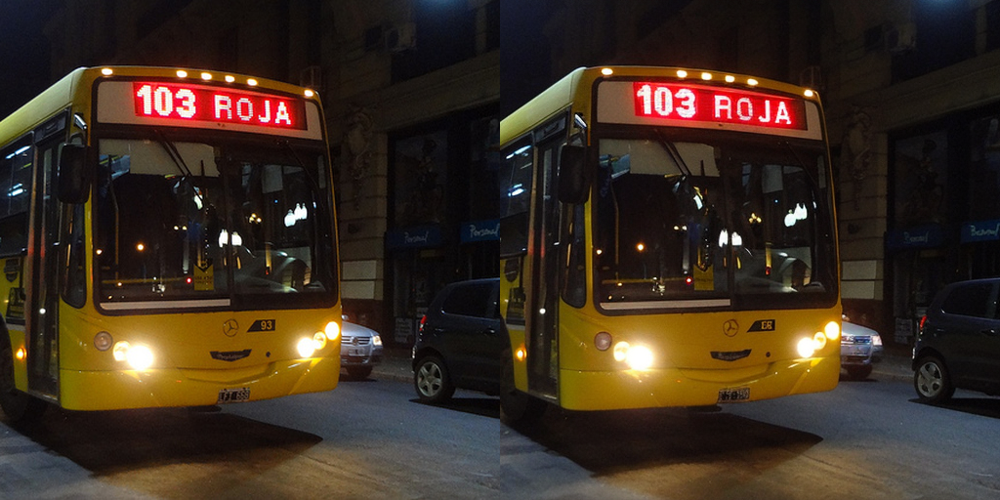

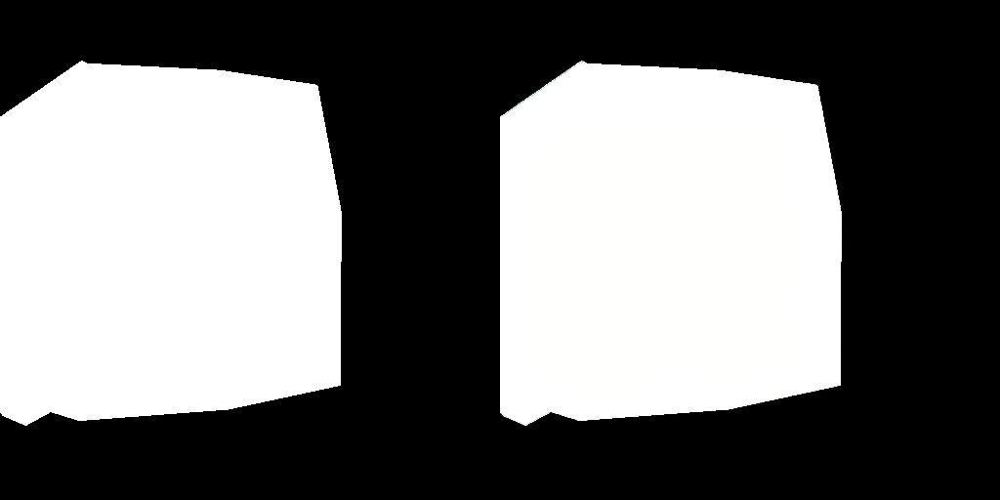

sandwich


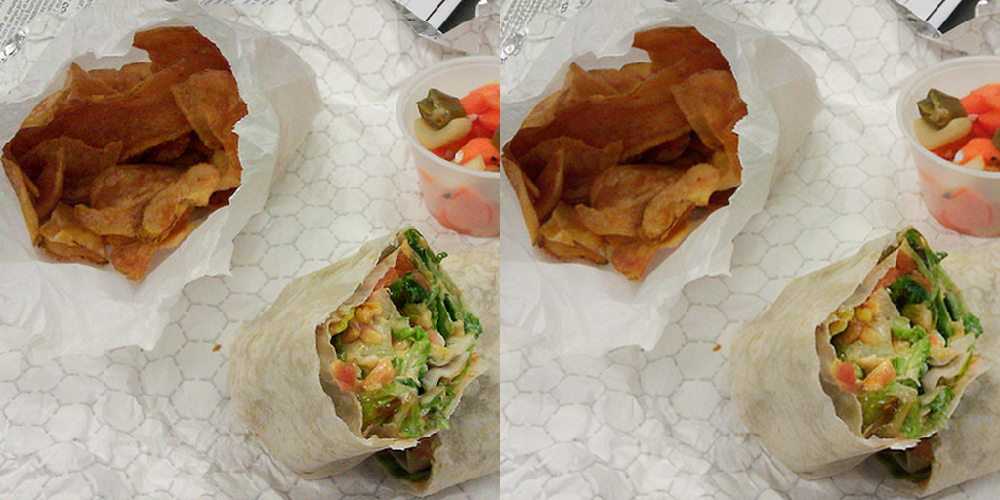

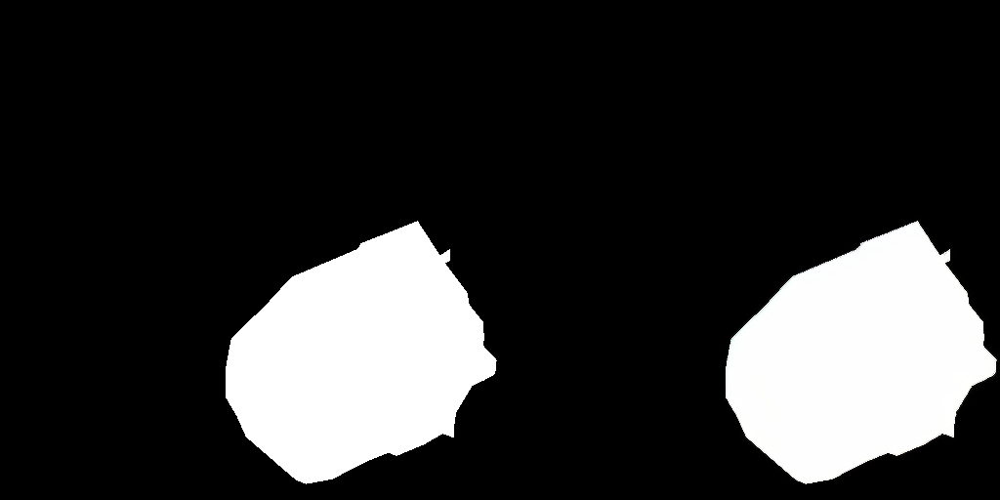

In [126]:
for _, item in zip(range(10), iter(val_dataset)):
    print(item["class"])
    show_original_vs_decoded(item["image"])
    show_original_vs_decoded(item["mask"])